In [1]:
import os
import zipfile
import tensorflow as tf
import numpy as np
# from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow.keras as keras

from glob import glob

import pandas as pd
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras import layers
from keras import Model, Input
from keras.applications.densenet import DenseNet201

from keras.callbacks import ReduceLROnPlateau, EarlyStopping

import torchvision.models as models
%matplotlib inline
import matplotlib.pyplot as plt

# Preprocessing

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
os.chdir('/content/drive/MyDrive/DGU_Ensemble model/Penyu_dataset_ori')

In [4]:
# Directory with our training horse pictures
train_dir = os.path.join('./train')
validation_dir = os.path.join( './validasi')
test_dir = os.path.join( './uji')

#penyu Hijau
latih_hijau = os.path.join('./train/Chelonia mydas')
#Lepidochelys olivacea
latih_lekang = os.path.join('./train/Lepidochelys olivacea')
#Penyu sisik
latih_sisik = os.path.join('./train/Eretmochelys imbricata')
#Penyu tempayan
latih_tempayan = os.path.join('./train/Caretta caretta')

#validasi Hijau
validasi_Hijau = os.path.join('./valid/Chelonia mydas')
#validasi Lekang
validasi_Lekang = os.path.join('./valid/Lepidochelys olivacea')
#validasi Sisik
validasi_Sisik = os.path.join('./valid/Eretmochelys imbricata')
#validasi Tempayan
validasi_Tempayan = os.path.join('./valid/Caretta caretta')

#uji Hijau
uji_Hijau = os.path.join('./test/Chelonia mydas')
#uji Lekang
uji_Lekang = os.path.join('./test/Lepidochelys olivacea')
#uji Sisik
uji_Sisik = os.path.join('./test/Eretmochelys imbricata')
#uji Tempayan
uji_Tempayan = os.path.join('./test/Caretta caretta')

In [5]:
#cek label
from pathlib import Path
image_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_dataset_ori')
# latih
latih_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_dataset_ori/train')
# validasi
validasi_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_dataset_ori/valid')
# uji
uji_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_dataset_ori/test')

# Get filepaths and labels
filepaths_ = list(image_dir.glob(r'**/*.jpg'))
labels_ = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_))

# Get filepaths and labels latih
filepaths_latih = list(latih_dir.glob(r'**/*.jpg'))
labels_latih = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_latih))
# Get filepaths and labels validasi
filepaths_validasi = list(validasi_dir.glob(r'**/*.jpg'))
labels_validasi = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_validasi))
# Get filepaths and labels uji
filepaths_uji = list(uji_dir.glob(r'**/*.jpg'))
labels_uji = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_uji))



In [6]:
filepaths = pd.Series(filepaths_, name='Filepath').astype(str)
labels = pd.Series(labels_, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(3)



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Caretta caretta


In [7]:
# latih
filepaths = pd.Series(filepaths_latih, name='Filepath').astype(str)
labels = pd.Series(labels_latih, name='Label')
# Concatenate filepaths_latih and labels
latih_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
latih_df = latih_df.sample(frac=1).reset_index(drop = True)

# Show the result
latih_df.head()



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Eretmochelys imbricata
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Eretmochelys imbricata
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
3,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
4,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea


In [8]:
# validasi
filepaths = pd.Series(filepaths_validasi, name='Filepath').astype(str)
labels = pd.Series(labels_validasi, name='Label')
# Concatenate filepaths_validasi and labels_validasi
validasi_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
validasi_df = validasi_df.sample(frac=1).reset_index(drop = True)

# Show the result
validasi_df.head(3)



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea


In [9]:
# uji
filepaths = pd.Series(filepaths_uji, name='Filepath').astype(str)
labels = pd.Series(labels_uji, name='Label')
# Concatenate filepaths_uji and labels_uji
uji_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
uji_df = uji_df.sample(frac=1).reset_index(drop = True)

# Show the result
uji_df.head(3)

,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas


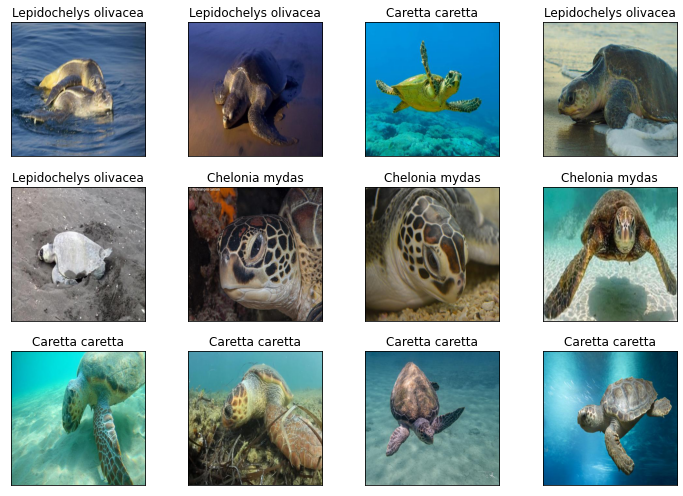

In [10]:
# Display some pictures of the dataset with their labels
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

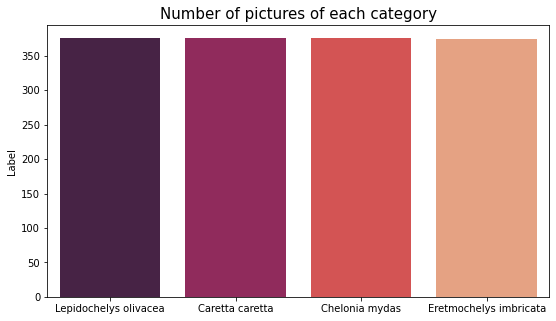

In [11]:
# Display the number of pictures of each category
import seaborn as sns
vc = image_df['Label'].value_counts()
plt.figure(figsize=(9,5))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 15)
plt.show()

In [12]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator()
validasi_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

train_data = train_datagen.flow_from_dataframe(dataframe=latih_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         shuffle=True,
                                         class_mode = 'categorical',
                                         )
validasi_data = validasi_datagen.flow_from_dataframe(dataframe=validasi_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         class_mode = 'categorical'
                                         )
uji_data = validasi_datagen.flow_from_dataframe(dataframe=uji_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         class_mode = 'categorical'
                                         )

Found 1392 validated image filenames belonging to 4 classes.
Found 74 validated image filenames belonging to 4 classes.
Found 36 validated image filenames belonging to 4 classes.


# Model Parameter

In [13]:
batch_size = 16
EPOCHS = 100
WARMUP_EPOCHS = 2
LEARNING_RATE = 0.001
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = 224
WIDTH = 224
CANAL = 3
N_CLASSES = 4
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [14]:
from keras import Model, Input
input_shape = (224,224,3)
model_input = Input(shape=input_shape)

# ** InceptionV3**


In [15]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-08-08 07:44:03--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 74.125.142.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   148MB/s    in 0.6s    

2022-08-08 07:44:04 (148 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [16]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape=input_shape, input_tensor=model_input, include_top=False, weights=None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = True

In [17]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [18]:
# Choose `mixed_7` as the last layer of your base model
last_layer = pre_trained_model.get_layer('mixed10')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 5, 5, 2048)


# Define Model Inceptionv3

In [19]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model
IMG_SHAPE = (224, 224, 3)
base_model =tf.keras.applications.InceptionV3(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x =tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x =tf.keras.layers.Dropout(0.15)(x)
x =tf.keras.layers.Dense(256, activation='relu')(x)
x =tf.keras.layers.Dropout(0.15)(x)
final_output =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output')(x)
model =tf.keras.models.Model(inputs=base_model.inputs,outputs=final_output)


87924736/87910968 [==============================] - 1s 0us/step


In [20]:
for layer in model.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 conv2d_107 (Conv2D)            (None, 25, 25, 48)   12288       ['mixed0[0][0]']                 
                                                                                                  
 conv2d_110 (Conv2D)            (None, 25, 25, 96)   55296       ['activation_109[0][0]']         
                                                                                                  
 batch_normalization_107 (Batch  (None, 25, 25, 48)  144         ['conv2d_107[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_110 (Batch  (None, 25, 25, 96)  288         ['conv2d_110[0][0]']             
 Normalization)                                                                                   
          

In [21]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_inc = model.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
87/87 [==============================] - 337s 4s/step - loss: 13.3597 - accuracy: 0.3197 - val_loss: 1.4317 - val_accuracy: 0.3281
Epoch 2/2
87/87 [==============================] - 8s 91ms/step - loss: 1.3689 - accuracy: 0.3254 - val_loss: 1.4194 - val_accuracy: 0.3281
Waktu Training: 350.49131059646606


In [22]:
for layer in model.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 conv2d_110 (Conv2D)            (None, 25, 25, 96)   55296       ['activation_109[0][0]']         
                                                                                                  
 batch_normalization_107 (Batch  (None, 25, 25, 48)  144         ['conv2d_107[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_110 (Batch  (None, 25, 25, 96)  288         ['conv2d_110[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_107 (Activation)    (None, 25, 25, 48)   0           ['batch_normalization_107[0][0]']
                                                                                                  
 activatio

In [23]:
history_finetunning_inc = model.fit_generator(generator=train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/100
87/87 [==============================] - 19s 121ms/step - loss: 1.1848 - accuracy: 0.4626 - val_loss: 14038.1445 - val_accuracy: 0.2812
Epoch 2/100
87/87 [==============================] - 9s 105ms/step - loss: 1.1374 - accuracy: 0.4763 - val_loss: 3.6618 - val_accuracy: 0.3438
Epoch 3/100
87/87 [==============================] - 9s 104ms/step - loss: 0.9934 - accuracy: 0.5761 - val_loss: 7.4893 - val_accuracy: 0.3906
Epoch 4/100
87/87 [==============================] - 9s 104ms/step - loss: 0.8899 - accuracy: 0.6164 - val_loss: 5.3107 - val_accuracy: 0.3438
Epoch 5/100
87/87 [==============================] - 9s 104ms/step - loss: 0.8156 - accuracy: 0.6379 - val_loss: 1.8959 - val_accuracy: 0.5781
Epoch 6/100
87/87 [==============================] - 9s 103ms/step - loss: 0.7875 - accuracy: 0.6681 - val_loss: 3.0743 - val_accuracy: 0.4219
Epoch 7/100
87/87 [==============================] - 10s 111ms/step - loss: 0.6995 - accuracy: 0.6940 - val_loss: 5.3738 - val_accuracy: 

# ***VISUALIZE THE RESULTS  Inceptionv3 ***

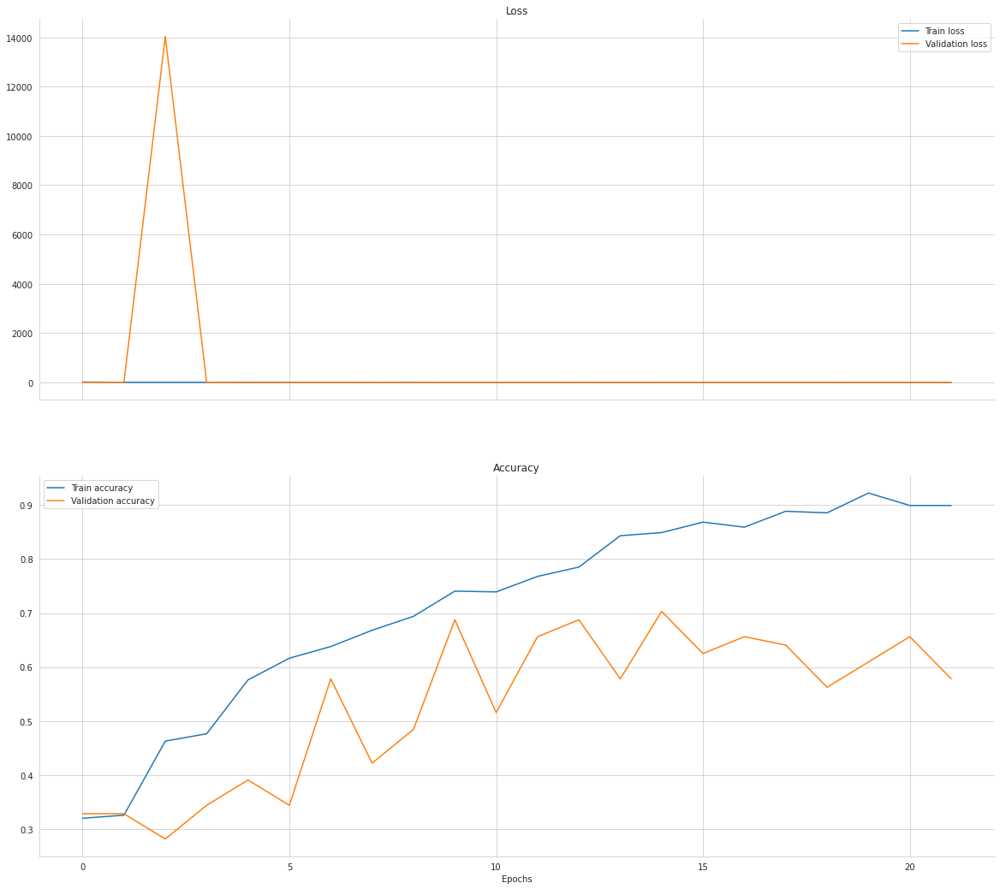

In [24]:
history_inc = {'loss': history_warmup_inc['loss'] + history_finetunning_inc['loss'], 
           'val_loss': history_warmup_inc['val_loss'] + history_finetunning_inc['val_loss'], 
           'acc': history_warmup_inc['accuracy'] + history_finetunning_inc['accuracy'], 
           'val_acc': history_warmup_inc['val_accuracy'] + history_finetunning_inc['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_inc['loss'], label='Train loss')
ax1.plot(history_inc['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_inc['acc'], label='Train accuracy')
ax2.plot(history_inc['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [25]:
# Predict the label of the test_images
import numpy as np
pred = model.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Caretta caretta', 'Eretmochelys imbricata', 'Caretta caretta', 'Eretmochelys imbricata']


In [26]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.33      0.44      0.38         9
        Chelonia mydas       0.00      0.00      0.00         9
Eretmochelys imbricata       0.25      0.33      0.29         9
 Lepidochelys olivacea       0.50      0.44      0.47         9

              accuracy                           0.31        36
             macro avg       0.27      0.31      0.28        36
          weighted avg       0.27      0.31      0.28        36



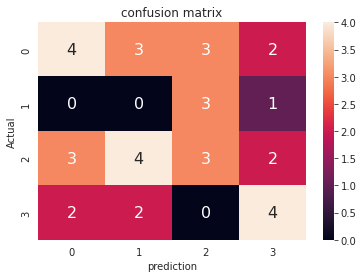

In [27]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# DenseNet201

In [28]:
IMG_SHAPE = (224, 224, 3)
base_model_dense =tf.keras.applications.DenseNet201(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_densenet =tf.keras.layers.GlobalAveragePooling2D()(base_model_dense.output)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
x_densenet =tf.keras.layers.Dense(1024, activation='relu')(x_densenet)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
final_output_dense =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_dense')(x_densenet)
model_densenet201 =tf.keras.models.Model(inputs=base_model_dense.inputs,outputs=final_output_dense)

74850304/74836368 [==============================] - 1s 0us/step


In [29]:
for layer in model_densenet201.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_densenet201.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 pool2_bn (BatchNormalization)  (None, 56, 56, 256)  1024        ['conv2_block6_concat[0][0]']    
                                                                                                  
 pool2_relu (Activation)        (None, 56, 56, 256)  0           ['pool2_bn[0][0]']               
                                                                                                  
 pool2_conv (Conv2D)            (None, 56, 56, 128)  32768       ['pool2_relu[0][0]']             
                                                                                                  
 pool2_pool (AveragePooling2D)  (None, 28, 28, 128)  0           ['pool2_conv[0][0]']             
                                                                                                  
 conv3_block1_0_bn (BatchNormal  (None, 28, 28, 128)  512        ['pool2_pool[0][0]']             
 ization)                                                                                         
          

In [30]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_den = model_densenet201.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
87/87 [==============================] - 24s 131ms/step - loss: 3.2891 - accuracy: 0.4425 - val_loss: 1.7031 - val_accuracy: 0.4375
Epoch 2/2
87/87 [==============================] - 9s 98ms/step - loss: 1.2434 - accuracy: 0.5761 - val_loss: 1.1644 - val_accuracy: 0.5781
Waktu Training: 32.72216725349426


In [31]:
for layer in model_densenet201.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 n)                                                                                               
                                                                                                  
 conv2_block6_1_conv (Conv2D)   (None, 56, 56, 128)  28672       ['conv2_block6_0_relu[0][0]']    
                                                                                                  
 conv2_block6_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block6_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block6_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block6_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_blo

In [32]:
history_finetunning_den = model_densenet201.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
87/87 [==============================] - 41s 229ms/step - loss: 1.1480 - accuracy: 0.4957 - val_loss: 5.4445 - val_accuracy: 0.3906
Epoch 2/100
87/87 [==============================] - 17s 194ms/step - loss: 0.9243 - accuracy: 0.6135 - val_loss: 5.0365 - val_accuracy: 0.4062
Epoch 3/100
87/87 [==============================] - 17s 194ms/step - loss: 0.7744 - accuracy: 0.7112 - val_loss: 1.2482 - val_accuracy: 0.6406
Epoch 4/100
87/87 [==============================] - 18s 201ms/step - loss: 0.7160 - accuracy: 0.7256 - val_loss: 2.7953 - val_accuracy: 0.5625
Epoch 5/100
87/87 [==============================] - 17s 193ms/step - loss: 0.6729 - accuracy: 0.7522 - val_loss: 3.5729 - val_accuracy: 0.4219
Epoch 6/100
87/87 [==============================] - 17s 191ms/step - loss: 0.5926 - accuracy: 0.7830 - val_loss: 1.2804 - val_accuracy: 0.6719
Epoch 7/100
87/87 [==============================] - 17s 192ms/step - loss: 0.5486 - accuracy: 0.8089 - val_loss: 3.2669 - val_accuracy:

# ***VISUALIZE THE RESULTS DenseNet201***

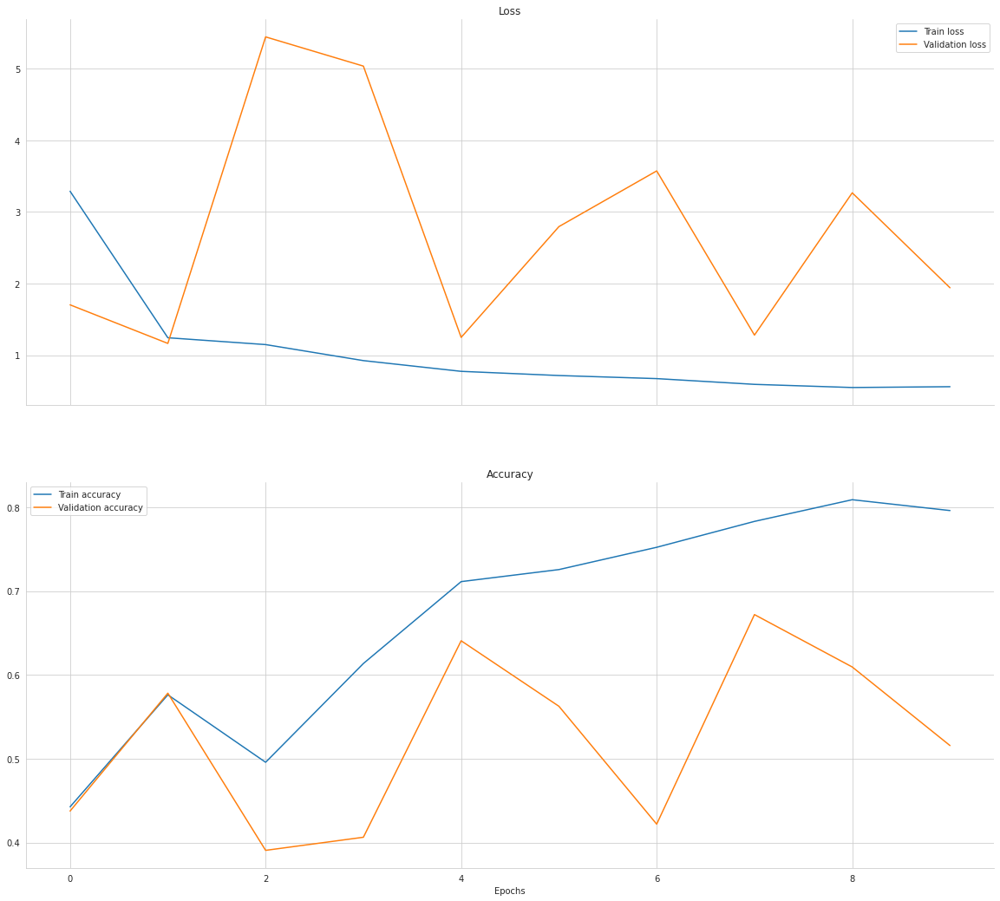

In [33]:
history_den = {'loss': history_warmup_den['loss'] + history_finetunning_den['loss'], 
           'val_loss': history_warmup_den['val_loss'] + history_finetunning_den['val_loss'], 
           'acc': history_warmup_den['accuracy'] + history_finetunning_den['accuracy'], 
           'val_acc': history_warmup_den['val_accuracy'] + history_finetunning_den['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_den['loss'], label='Train loss')
ax1.plot(history_den['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_den['acc'], label='Train accuracy')
ax2.plot(history_den['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [34]:
# Predict the label of the test_images
import numpy as np
pred = model_densenet201.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Chelonia mydas', 'Chelonia mydas', 'Lepidochelys olivacea']


In [35]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.00      0.00      0.00         9
        Chelonia mydas       0.50      0.33      0.40         9
Eretmochelys imbricata       0.15      0.22      0.18         9
 Lepidochelys olivacea       0.29      0.56      0.38         9

              accuracy                           0.28        36
             macro avg       0.24      0.28      0.24        36
          weighted avg       0.24      0.28      0.24        36



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


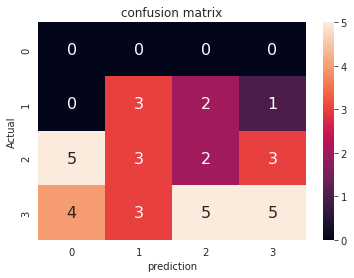

In [36]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# `Rednet50


In [37]:
IMG_SHAPE = (224, 224, 3)
from tensorflow.keras.applications import resnet50
base_model_resnet50 =resnet50.ResNet50(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_resnet50 =tf.keras.layers.GlobalAveragePooling2D()(base_model_resnet50.output)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
x_resnet50 =tf.keras.layers.Dense(256, activation='relu')(x_resnet50)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
final_output_resnet50 =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_resnet50')(x_resnet50)
model_resnet50 =tf.keras.models.Model(inputs=base_model_resnet50.inputs,outputs=final_output_resnet50)

94781440/94765736 [==============================] - 0s 0us/step


In [38]:
for layer in model_resnet50.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_resnet50.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 n)                                                                                               
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block2_2_relu[0][0]']    
                                                                                                  
 conv3_block2_3_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block2_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_add (Add)         (None, 28, 28, 512)  0           ['conv3_block1_out[0][0]',       
                                                                  'conv3_block2_3_bn[0][0]']      
                                                                                                  
 conv3_blo

In [39]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_r50 = model_resnet50.fit(train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

Epoch 1/2
87/87 [==============================] - 12s 100ms/step - loss: 1.1408 - accuracy: 0.5747 - val_loss: 0.7246 - val_accuracy: 0.7188
Epoch 2/2
87/87 [==============================] - 8s 90ms/step - loss: 0.5867 - accuracy: 0.7780 - val_loss: 0.7730 - val_accuracy: 0.6562
Waktu Training: 20.27595615386963


In [40]:
for layer in model_resnet50.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 conv3_block1_0_conv (Conv2D)   (None, 28, 28, 512)  131584      ['conv2_block3_out[0][0]']       
                                                                                                  
 conv3_block1_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block1_2_relu[0][0]']    
                                                                                                  
 conv3_block1_0_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_0_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block1_3_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_3_conv[0][0]']    
 ization)                                                                                         
          

In [41]:
history_finetunning_r50 = model_resnet50.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
87/87 [==============================] - 17s 126ms/step - loss: 1.2668 - accuracy: 0.4483 - val_loss: 663.8538 - val_accuracy: 0.2969
Epoch 2/100
87/87 [==============================] - 11s 122ms/step - loss: 1.0708 - accuracy: 0.5359 - val_loss: 82.1848 - val_accuracy: 0.2031
Epoch 3/100
87/87 [==============================] - 10s 117ms/step - loss: 0.9252 - accuracy: 0.6085 - val_loss: 12.7318 - val_accuracy: 0.2500
Epoch 4/100
87/87 [==============================] - 10s 114ms/step - loss: 0.9144 - accuracy: 0.6034 - val_loss: 3.5118 - val_accuracy: 0.3750
Epoch 5/100
87/87 [==============================] - 10s 112ms/step - loss: 0.7793 - accuracy: 0.6983 - val_loss: 6.5196 - val_accuracy: 0.3125
Epoch 6/100
87/87 [==============================] - 10s 114ms/step - loss: 0.7325 - accuracy: 0.7234 - val_loss: 1.6286 - val_accuracy: 0.5000
Epoch 7/100
87/87 [==============================] - 10s 113ms/step - loss: 0.6556 - accuracy: 0.7371 - val_loss: 2.3243 - val_accur

# ***VISUALIZE THE RESULTS Ensemble Resnet50***

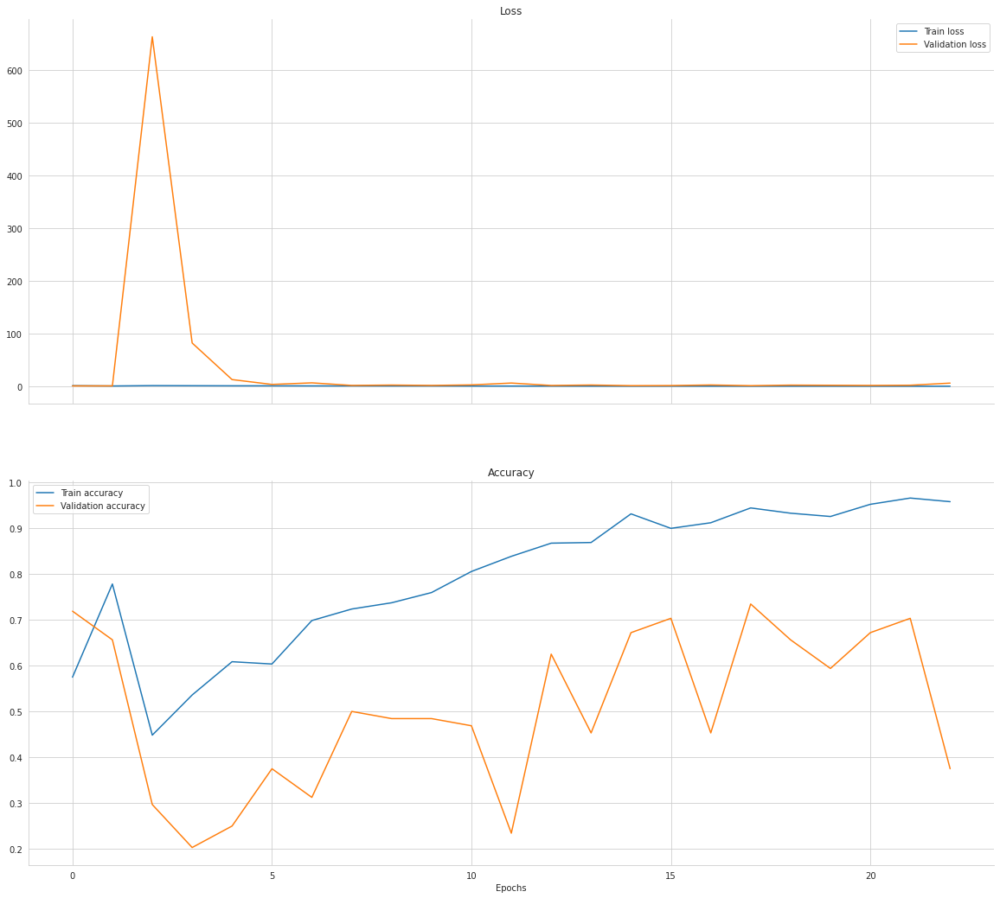

In [42]:
history_res = {'loss': history_warmup_r50['loss'] + history_finetunning_r50['loss'], 
           'val_loss': history_warmup_r50['val_loss'] + history_finetunning_r50['val_loss'], 
           'acc': history_warmup_r50['accuracy'] + history_finetunning_r50['accuracy'], 
           'val_acc': history_warmup_r50['val_accuracy'] + history_finetunning_r50['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_res['loss'], label='Train loss')
ax1.plot(history_res['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_res['acc'], label='Train accuracy')
ax2.plot(history_res['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [43]:
# Predict the label of the test_images
import numpy as np
pred = model_resnet50.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Caretta caretta', 'Lepidochelys olivacea', 'Caretta caretta', 'Chelonia mydas']


In [44]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.12      0.11      0.12         9
        Chelonia mydas       0.00      0.00      0.00         9
Eretmochelys imbricata       0.27      0.33      0.30         9
 Lepidochelys olivacea       0.27      0.33      0.30         9

              accuracy                           0.19        36
             macro avg       0.17      0.19      0.18        36
          weighted avg       0.17      0.19      0.18        36



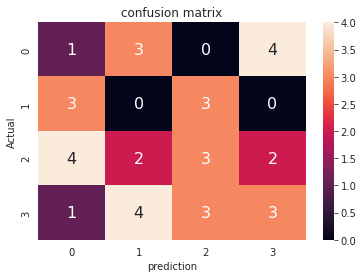

In [45]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# Ensemble Inception & resnet50


In [46]:
models = [model, model_resnet50]
model_outputs = [model(model_input) for model in models]
ensemble_output = tf.keras.layers.Average()(model_outputs)
ensemble_model = tf.keras.Model(inputs=model_input, outputs=ensemble_output)

In [47]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [48]:
ensemble_model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Inception & desnet201





In [49]:
models = [model, model_densenet201]
model_outputs_ID = [model(model_input) for model in models]
ensemble_output_ID = tf.keras.layers.Average()(model_outputs_ID)
ensemble_model_ID = tf.keras.Model(inputs=model_input, outputs=ensemble_output_ID)

In [50]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [51]:
ensemble_model_ID.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Resnet50 & desnet201





In [52]:
models = [model, model_densenet201]
model_outputs_DR = [model(model_input) for model in models]
ensemble_output_DR = tf.keras.layers.Average()(model_outputs_DR)
ensemble_model_DR = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DR)

In [53]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [54]:
ensemble_model_DR.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble InceptionV3, Resnet50 & DenseNet201





In [55]:
models = [model, model_densenet201, model_resnet50]
model_outputs_DRI = [model(model_input) for model in models]
ensemble_output_DRI = tf.keras.layers.Average()(model_outputs_DRI)
ensemble_model_DRI = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DRI)

In [56]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [57]:
ensemble_model_DRI.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & Resnet50***

In [58]:
metrics_train = ensemble_model.evaluate(train_data)
metrics_test = ensemble_model.evaluate(uji_data)

3/3 [==============================] - 0s 68ms/step - loss: 0.6422 - accuracy: 0.7500


In [59]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.16028012335300446, 0.9691091775894165]
--------------------------------------------
TEST_SET: [0.6421757340431213, 0.75]


In [60]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Chelonia mydas', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata']


In [61]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.27      0.33      0.30         9
        Chelonia mydas       0.25      0.11      0.15         9
Eretmochelys imbricata       0.31      0.44      0.36         9
 Lepidochelys olivacea       0.12      0.11      0.12         9

              accuracy                           0.25        36
             macro avg       0.24      0.25      0.23        36
          weighted avg       0.24      0.25      0.23        36



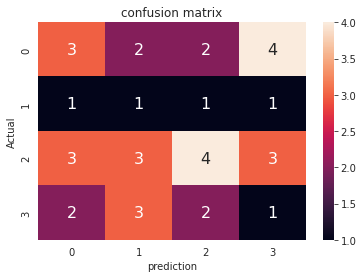

In [62]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

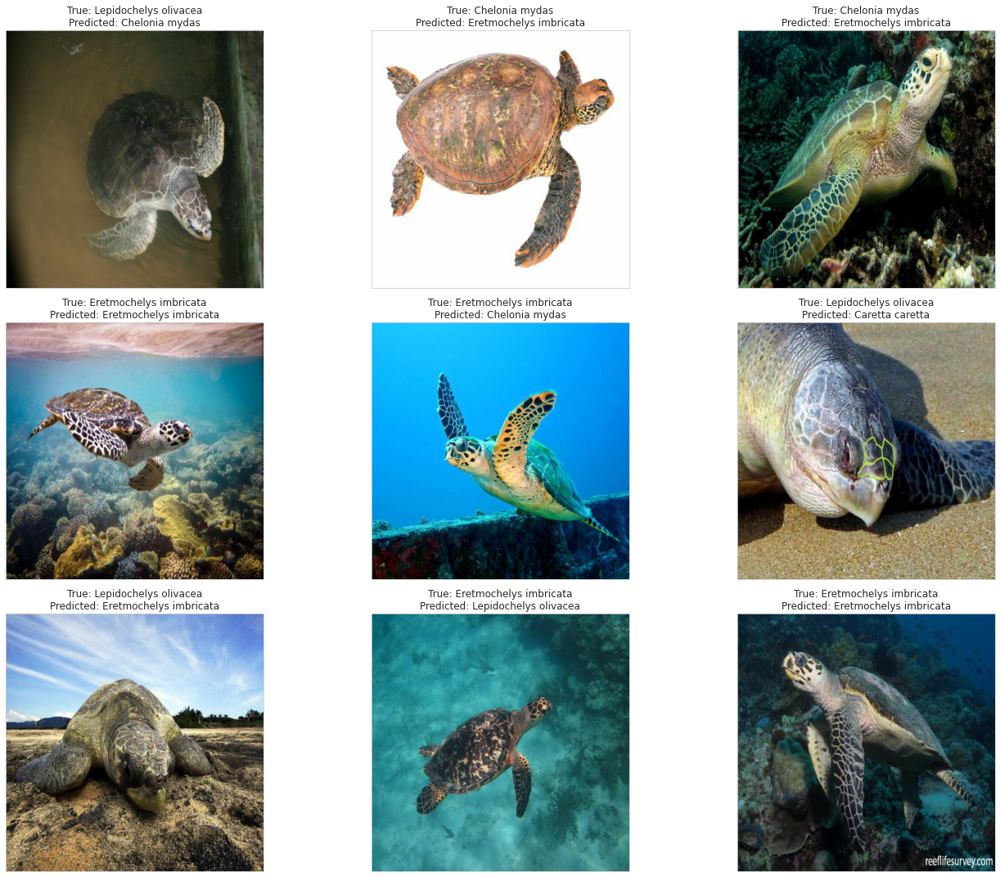

In [63]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & DenseNet201***

In [64]:
metrics_train = ensemble_model_ID.evaluate(train_data)
metrics_test = ensemble_model_ID.evaluate(uji_data)

3/3 [==============================] - 0s 77ms/step - loss: 0.6808 - accuracy: 0.7778


In [65]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.40230101346969604, 0.9353448152542114]
--------------------------------------------
TEST_SET: [0.6807661056518555, 0.7777777910232544]


In [66]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_ID.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Lepidochelys olivacea', 'Eretmochelys imbricata', 'Eretmochelys imbricata']


In [67]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.33      0.33      0.33         9
        Chelonia mydas       0.40      0.22      0.29         9
Eretmochelys imbricata       0.36      0.44      0.40         9
 Lepidochelys olivacea       0.36      0.44      0.40         9

              accuracy                           0.36        36
             macro avg       0.37      0.36      0.35        36
          weighted avg       0.37      0.36      0.35        36



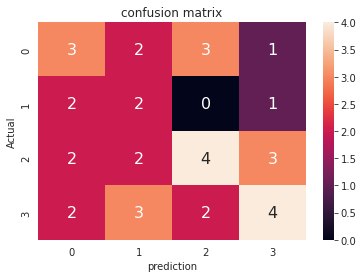

In [68]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

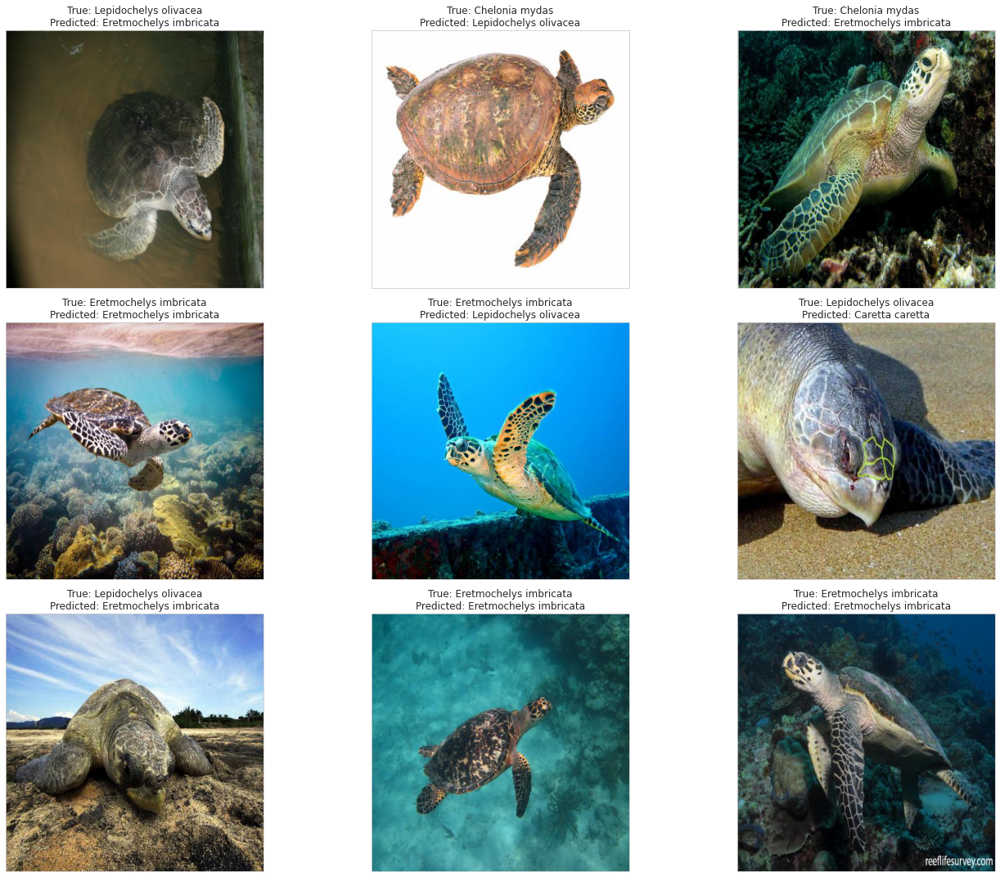

In [69]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Resnet50 & DenseNet201***

In [70]:
metrics_train = ensemble_model_DR.evaluate(train_data)
metrics_test = ensemble_model_DR.evaluate(uji_data)

3/3 [==============================] - 0s 79ms/step - loss: 0.6808 - accuracy: 0.7778


In [71]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.40230104327201843, 0.9353448152542114]
--------------------------------------------
TEST_SET: [0.6807677745819092, 0.7777777910232544]


In [72]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DR.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Lepidochelys olivacea', 'Eretmochelys imbricata', 'Lepidochelys olivacea', 'Chelonia mydas']


In [73]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.33      0.33      0.33         9
        Chelonia mydas       0.40      0.22      0.29         9
Eretmochelys imbricata       0.09      0.11      0.10         9
 Lepidochelys olivacea       0.45      0.56      0.50         9

              accuracy                           0.31        36
             macro avg       0.32      0.31      0.30        36
          weighted avg       0.32      0.31      0.30        36



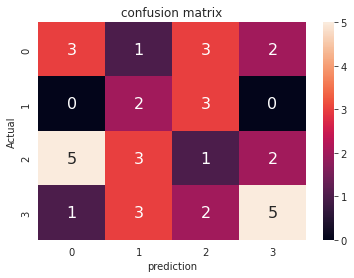

In [74]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

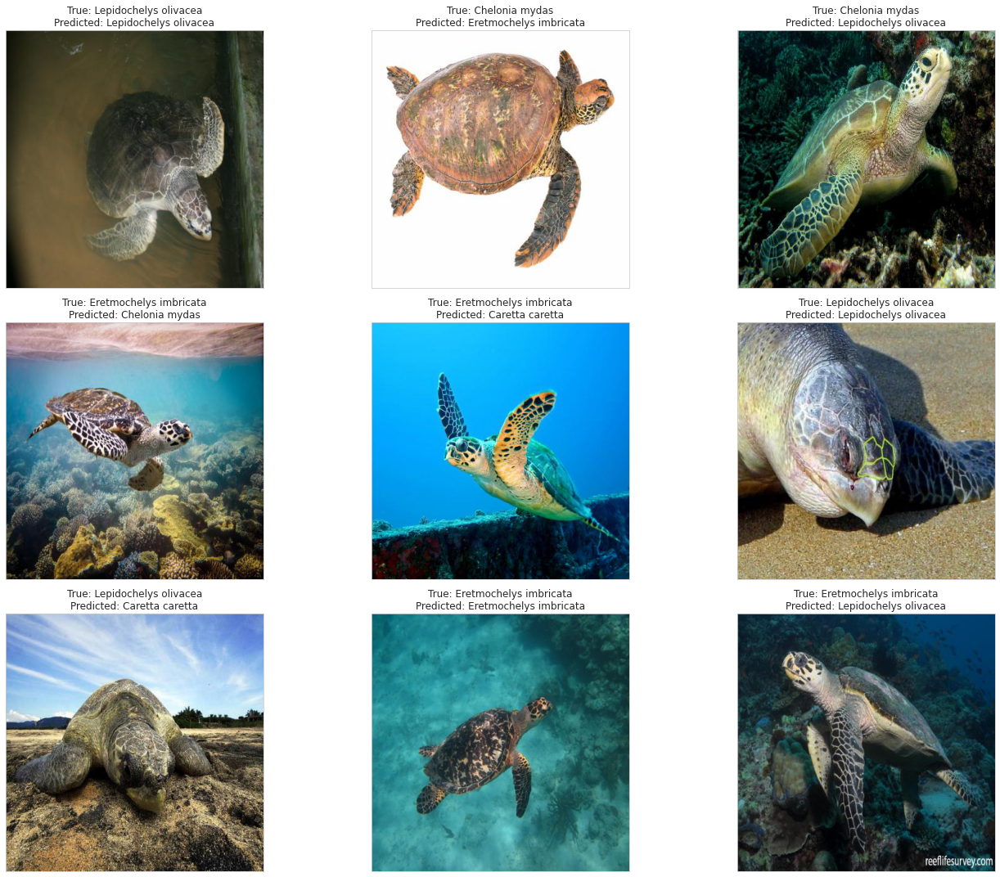

In [75]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3, Resnet50 & DenseNet201***

In [76]:
metrics_train = ensemble_model_DRI.evaluate(train_data)
metrics_test = ensemble_model_DRI.evaluate(uji_data)

3/3 [==============================] - 0s 93ms/step - loss: 0.6236 - accuracy: 0.6667


In [77]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.2890735864639282, 0.9748563170433044]
--------------------------------------------
TEST_SET: [0.6235918998718262, 0.6666666865348816]


In [78]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DRI.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Chelonia mydas', 'Caretta caretta', 'Lepidochelys olivacea', 'Caretta caretta']


In [79]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.20      0.11      0.14         9
        Chelonia mydas       0.00      0.00      0.00         9
Eretmochelys imbricata       0.21      0.33      0.26         9
 Lepidochelys olivacea       0.23      0.33      0.27         9

              accuracy                           0.19        36
             macro avg       0.16      0.19      0.17        36
          weighted avg       0.16      0.19      0.17        36



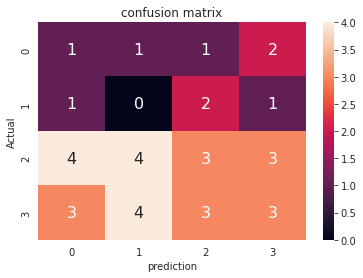

In [80]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

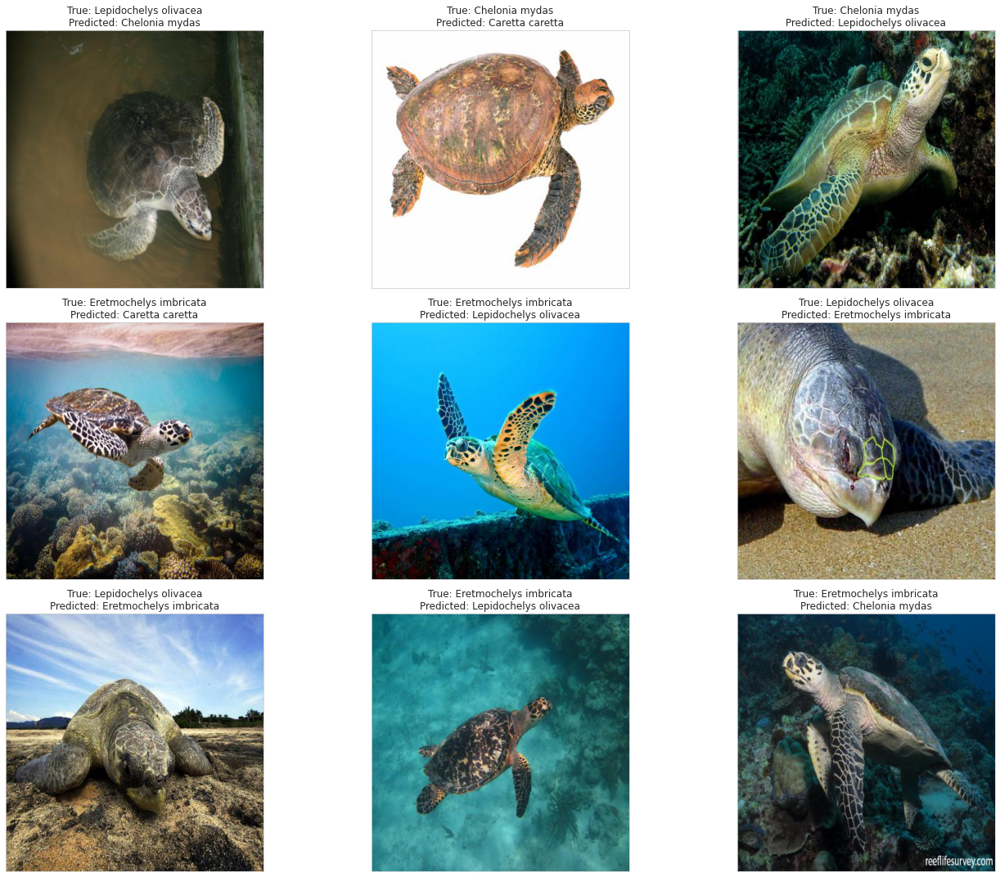

In [81]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()